# Problem 7 

## Problem Description

 You will find data from several properties in Madrid as well as some historical and sociodemographic data. Tasks:
 1. Analyze this dataset to estimate property prices as a regression problem.
     • Use algorithm seen so far in class
     • OPTIONAL: use other methods and compare results
     
 2. Analyze data and redefine the problem to create a classification one.
     • Use the following algorithms and analyze results
     • Perceptron Learning / Pocket Algorithm• Logistic Regression
     • Generative Models (LDA, QDA)
     • KNN
     • OPTIONAL: use other methods and compare results

In [195]:
import sqlite3
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
from pandas_visual_analysis import VisualAnalysis
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis, QuadraticDiscriminantAnalysis
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.tree import DecisionTreeRegressor
from sklearn.svm import SVR
from sklearn.ensemble import RandomForestRegressor
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import GridSearchCV, cross_val_score
from sklearn.model_selection import train_test_split
from sklearn.linear_model import Perceptron, LogisticRegression
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.metrics import accuracy_score, ConfusionMatrixDisplay
from sklearn.preprocessing import LabelEncoder
from sklearn.linear_model import LinearRegression, Lasso, Ridge
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_squared_error
from scipy.stats import shapiro, boxcox_normmax, boxcox
from statsmodels.graphics.gofplots import qqplot
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
import warnings
warnings.filterwarnings("ignore")


df = pd.read_excel("./session_7_dataset.xlsx")

In [196]:
df.drop("Unnamed: 0", axis=1, inplace=True)

In [197]:
df

,inm_floor,inm_size,inm_price,inm_longitude,inm_latitude,inm_barrio,inm_distrito,his_price,his_quarterly_variation,his_annual_variation,...,dem_TasaDeParo,dem_TamanoMedioDelHogar,dem_PropSinEstudiosUniversitarios,dem_PropSinEstudios,dem_Proporcion_de_nacidos_fuera_de_Espana,dem_PropConEstudiosUniversitarios,dem_PobTotal,dem_NumViviendas,dem_EdadMedia,dem_Densidad_(Habit/Ha)
0,3.0,141.0,990000,-3.656875,40.464347,Canillas,Hortaleza,3250,2.2,0.3,...,8.724674,2.527886,0.488949,0.175632,15.456193,NaN,40838,16155,NaN,161.894356
1,2.0,159.0,940000,-3.703523,40.419427,Universidad,Centro,5106,1.4,-4.3,...,9.006094,1.975877,0.386598,0.083812,32.102460,0.529590,33418,16913,43.678945,352.500616
2,NaN,NaN,549000,-3.669626,40.435362,Guindalera,Salamanca,4100,0.6,-4.1,...,7.441379,2.369951,0.365818,0.070351,18.224365,0.563831,42306,17851,46.477166,263.952286
3,2.0,232.0,750000,-3.720619,40.424164,Argüelles,Moncloa - Aravaca,4773,0.5,-3.7,...,6.709633,2.328217,0.343683,0.066403,20.963846,0.589914,24423,10490,46.972342,322.402577
4,4.0,183.0,1550000,-3.705909,40.413214,Sol,Centro,4739,-5.5,-5.3,...,9.058980,1.994244,0.433750,0.082242,39.490947,0.484009,7622,3822,44.632774,171.165183
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17852,0.0,28.0,94000,-3.705236,40.448713,Bellas Vistas,Tetuán,3489,-0.3,-0.7,...,9.666273,2.483180,0.507461,0.139521,36.845626,0.353018,29895,12039,43.224268,418.012531
17853,1.0,247.0,1250000,-3.797123,40.458962,Aravaca,NaN,3683,3.1,0.8,...,5.072028,3.159086,0.318851,0.071317,15.663746,0.609832,27503,8706,40.112479,47.142277
17854,3.0,73.0,137260,-3.731940,40.377805,NaN,Carabanchel,1859,-0.9,-4.1,...,12.527023,2.858792,0.600245,0.221107,34.012583,0.178648,31947,11175,42.374887,204.190236
17855,5.0,72.0,304880,-3.704166,40.455556,Berruguete,Tetuán,3345,1.8,2.8,...,10.119032,2.476095,0.536667,0.153495,37.770383,0.309838,25843,10437,NaN,425.705154


### First look at the data

In [198]:
print("Type of data:", type(df))
print("\nDimensions: \nNumber of rows:",df.shape[0], "\nNumber of columns:",df.shape[1])
df

Type of data: <class 'pandas.core.frame.DataFrame'>

Dimensions: 
Number of rows: 17857 
Number of columns: 25


,inm_floor,inm_size,inm_price,inm_longitude,inm_latitude,inm_barrio,inm_distrito,his_price,his_quarterly_variation,his_annual_variation,...,dem_TasaDeParo,dem_TamanoMedioDelHogar,dem_PropSinEstudiosUniversitarios,dem_PropSinEstudios,dem_Proporcion_de_nacidos_fuera_de_Espana,dem_PropConEstudiosUniversitarios,dem_PobTotal,dem_NumViviendas,dem_EdadMedia,dem_Densidad_(Habit/Ha)
0,3.0,141.0,990000,-3.656875,40.464347,Canillas,Hortaleza,3250,2.2,0.3,...,8.724674,2.527886,0.488949,0.175632,15.456193,NaN,40838,16155,NaN,161.894356
1,2.0,159.0,940000,-3.703523,40.419427,Universidad,Centro,5106,1.4,-4.3,...,9.006094,1.975877,0.386598,0.083812,32.102460,0.529590,33418,16913,43.678945,352.500616
2,NaN,NaN,549000,-3.669626,40.435362,Guindalera,Salamanca,4100,0.6,-4.1,...,7.441379,2.369951,0.365818,0.070351,18.224365,0.563831,42306,17851,46.477166,263.952286
3,2.0,232.0,750000,-3.720619,40.424164,Argüelles,Moncloa - Aravaca,4773,0.5,-3.7,...,6.709633,2.328217,0.343683,0.066403,20.963846,0.589914,24423,10490,46.972342,322.402577
4,4.0,183.0,1550000,-3.705909,40.413214,Sol,Centro,4739,-5.5,-5.3,...,9.058980,1.994244,0.433750,0.082242,39.490947,0.484009,7622,3822,44.632774,171.165183
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17852,0.0,28.0,94000,-3.705236,40.448713,Bellas Vistas,Tetuán,3489,-0.3,-0.7,...,9.666273,2.483180,0.507461,0.139521,36.845626,0.353018,29895,12039,43.224268,418.012531
17853,1.0,247.0,1250000,-3.797123,40.458962,Aravaca,NaN,3683,3.1,0.8,...,5.072028,3.159086,0.318851,0.071317,15.663746,0.609832,27503,8706,40.112479,47.142277
17854,3.0,73.0,137260,-3.731940,40.377805,NaN,Carabanchel,1859,-0.9,-4.1,...,12.527023,2.858792,0.600245,0.221107,34.012583,0.178648,31947,11175,42.374887,204.190236
17855,5.0,72.0,304880,-3.704166,40.455556,Berruguete,Tetuán,3345,1.8,2.8,...,10.119032,2.476095,0.536667,0.153495,37.770383,0.309838,25843,10437,NaN,425.705154


In [199]:
#Basic Information about dataset
df.info()

df.describe()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17857 entries, 0 to 17856
Data columns (total 25 columns):
 #   Column                                           Non-Null Count  Dtype  
---  ------                                           --------------  -----  
 0   inm_floor                                        14067 non-null  float64
 1   inm_size                                         16090 non-null  float64
 2   inm_price                                        17857 non-null  int64  
 3   inm_longitude                                    17857 non-null  float64
 4   inm_latitude                                     17857 non-null  float64
 5   inm_barrio                                       16063 non-null  object 
 6   inm_distrito                                     16110 non-null  object 
 7   his_price                                        17857 non-null  int64  
 8   his_quarterly_variation                          17857 non-null  float64
 9   his_annual_variation        

,inm_floor,inm_size,inm_price,inm_longitude,inm_latitude,his_price,his_quarterly_variation,his_annual_variation,his_monthly_variation,dem_Indice_de_reemplazo_de_la_poblacion_activa,...,dem_TasaDeParo,dem_TamanoMedioDelHogar,dem_PropSinEstudiosUniversitarios,dem_PropSinEstudios,dem_Proporcion_de_nacidos_fuera_de_Espana,dem_PropConEstudiosUniversitarios,dem_PobTotal,dem_NumViviendas,dem_EdadMedia,dem_Densidad_(Habit/Ha)
count,14067.000000,16090.000000,1.785700e+04,17857.000000,17857.000000,17857.000000,17857.000000,17857.000000,17857.000000,17857.000000,...,17857.000000,17857.000000,17857.000000,17857.000000,17857.000000,16132.000000,17857.000000,17857.000000,16067.000000,17857.000000
mean,2.696453,149.013753,6.964702e+05,-3.688064,40.424817,3993.643389,0.437918,-1.814499,0.035549,58.387524,...,8.736896,2.487494,0.436518,0.124281,24.851753,0.439830,28281.995296,11515.008960,44.315032,233.372820
std,2.387135,160.485808,8.547274e+05,0.039164,0.031176,1589.895597,2.510048,3.847875,1.533065,23.241554,...,3.042722,0.300608,0.109068,0.076923,8.542049,0.181168,13117.299282,5322.072109,2.842113,122.653928
min,-1.000000,8.000000,1.600000e+04,-3.837697,40.328140,1290.000000,-16.100000,-11.600000,-5.200000,26.976744,...,3.643735,1.975877,0.246480,0.036422,8.884988,0.072421,2398.000000,872.000000,33.198916,2.267773
25%,1.000000,66.000000,1.899000e+05,-3.708170,40.402633,2578.000000,-1.100000,-4.300000,-0.600000,41.889843,...,6.291480,2.297491,0.340818,0.062095,18.746056,0.257582,18785.000000,8011.000000,43.161070,155.641754
50%,2.000000,98.000000,3.700000e+05,-3.692498,40.426586,4049.000000,0.500000,-2.200000,0.000000,51.910341,...,8.076921,2.466320,0.391468,0.085268,23.400147,0.512828,25023.000000,10637.000000,45.113343,228.165728
75%,4.000000,166.000000,8.490000e+05,-3.669516,40.446864,5106.000000,1.900000,-0.100000,0.900000,65.111111,...,10.802359,2.673612,0.551965,0.191202,31.219133,0.592631,36922.000000,15312.000000,46.244228,322.402577
max,60.000000,2400.000000,1.500000e+07,-3.545674,40.507659,8299.000000,12.200000,17.200000,8.100000,171.272727,...,18.030112,3.506552,0.641264,0.355659,53.296248,0.699977,67418.000000,26836.000000,49.332035,460.612389


In [200]:
#Check for non-numerical columns
df.select_dtypes(exclude=np.number)

,inm_barrio,inm_distrito
0,Canillas,Hortaleza
1,Universidad,Centro
2,Guindalera,Salamanca
3,Argüelles,Moncloa - Aravaca
4,Sol,Centro
...,...,...
17852,Bellas Vistas,Tetuán
17853,Aravaca,NaN
17854,NaN,Carabanchel
17855,Berruguete,Tetuán


In [201]:
print("Number of neighborhoods: ", len(df.inm_barrio.unique()))
print("Number of districts: ", len(df.inm_distrito.unique()))

Number of neighborhoods:  122
Number of districts:  22


Comment:

We have seen that vast majority of our columns are numeric and only 2 are categorical. These will simplify exploration but also means that we need to pay attention to distribution, scale, and outliers. When it come to categorical variables, they are rather of a high-cardinality. (122 for barrio, 22 for distrito) This could mean that there maybe a need to transform then in a way that would simplify computation (that remains to be decided later)

Also, statistical analysis of numerical columns has shown that we have multiple columns with different scale of values (due to, for example, unit they use in practice). That also needs to be taken care of during later stages.

## Exploratory Data Analysis (EDA) & Data Cleaning

In this part, I decided to simultenously explore, visualize, and correct variables and common problems aassociated with data, especially in the context of linear regression. I will concentrate on distribution and provide more context before deciding on transformation, normalization, and scailing. Instead of creating multiple lines of code for each graph I will use a valuable tool — Visual Analytics — to provide the reader with the multiple intercative graphs in a one window. Then I will move to investigating the distribution of each variable and applying neccesary changes, if needed. 

When it comes to particular cleaning processes, I will look at:
1. Missing Values
2. Duplicates
3. Irrelevant data
4. Outliers
5. Typos and wrong string values
6. Standarization 
7. Transformation 
8. Normalization


### General Analysis


In [13]:
VisualAnalysis(df)

<i> Because Visual Analysis library is not visible in html mode I include the screenshot <i>
    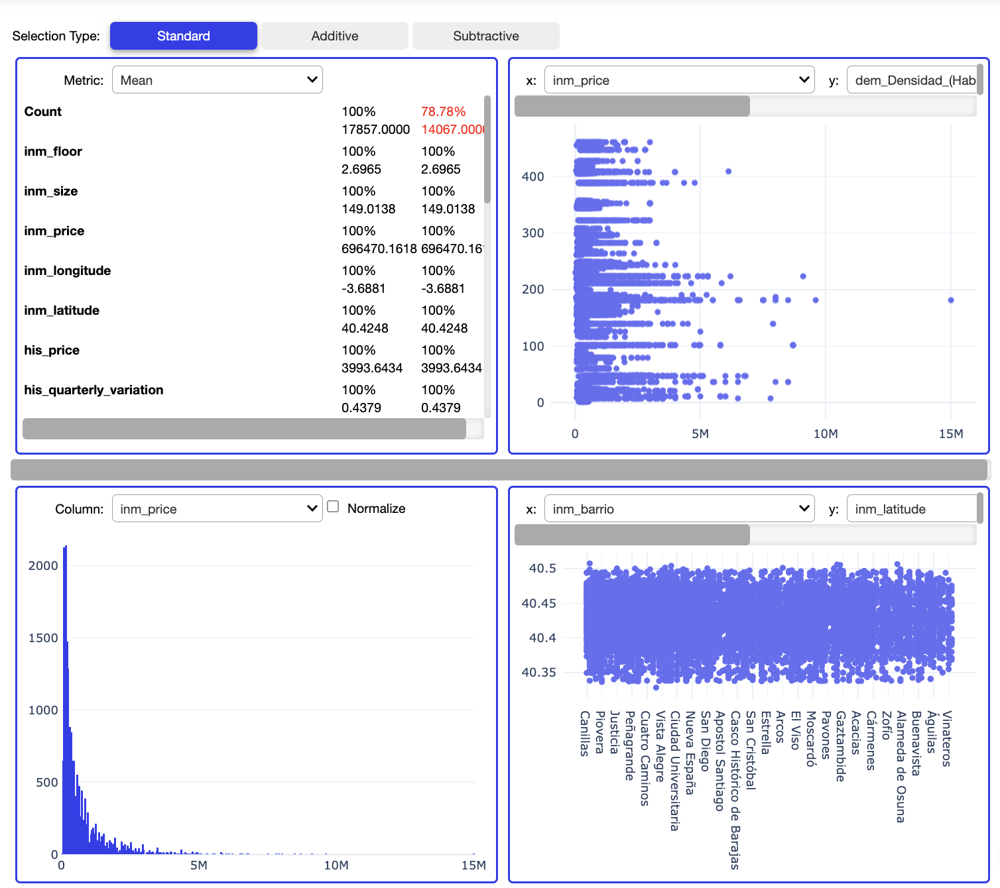

In [202]:
#Check for duplicates
print("Number of Duplicates", df.duplicated().sum())

Number of Duplicates 6


In [203]:
#Drop duplicates - its number is not that significant for the overall dataset
df.drop_duplicates(inplace=True)

<b> Comment: <b>
    
Based on the initial observations, we may clearly see that distribution of particular variables is approximating the normal one (not for all variables tho), but it's far from perfect. In some of them, we have many peaks in distribution or a skew.
    
We can also see that there is not one decisive variable that would be highly correlated with inm_price (our target variable). Yet, the closest to that is <b> inm_size <b> which would provide a valuable information to the model in that case.
    
We also have 6 duplicates, but because it's a very small percentage of total dataset size, I decided to drop it.

Moreover, we see an interesting phenomena:

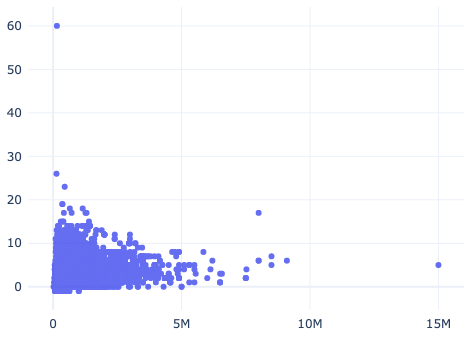
    <center> <i> x-axis: Floor <i> <br>
<i> y-axis: Price <i> <br>
  Number of floors is not that important for the price — even more: the less floors the more expensive the apartment.
<center>
 

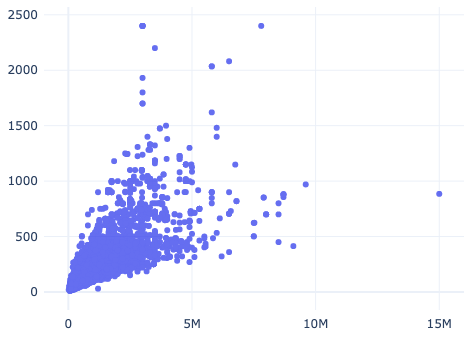
<center> <i> x-axis: Size of Apartment <i> <br>
<i> y-axis: Price <i> <br>
    Price is directly proportional to size — As the size of the Apartment increases, the price also increases.<center>

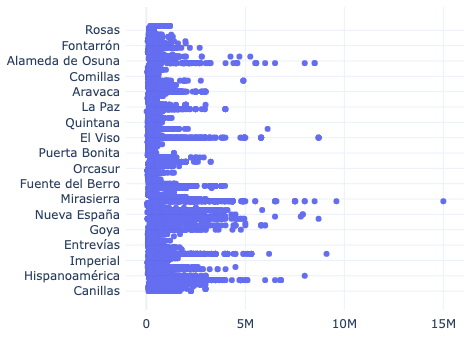
<center> <i> x-axis: Barrio <i> <br>
<i> y-axis: Price <i> <br>
    Alameda de Osuna, Hispanoamerica, Mirasierra, El Viso — those are the most important barrios. However, density of apartments is also important — it indicates whether particular region is rather closed, but with expensive apartments, or is generally (full of) aprtaments with a high price. This can mean, for example, an excellent location.<center>

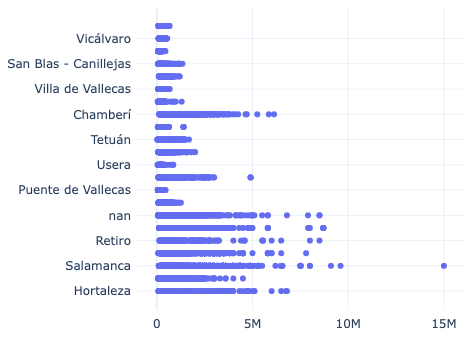
<center> <i> x-axis: Distrito <i> <br>
<i> y-axis: Price <i> <br>Chamberi, Salamanca, and Retiro — the most expensive regions of the city when it comes to apartment price. <center>

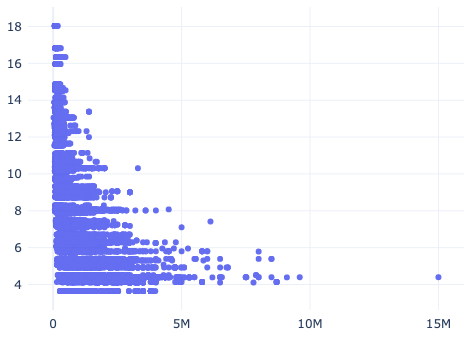
<center> <i> x-axis: Tasa de Paro <i> <br>
<i> y-axis: Price <i> <br> The Lower the regional unemployment, the more expensive are apartments.<center>

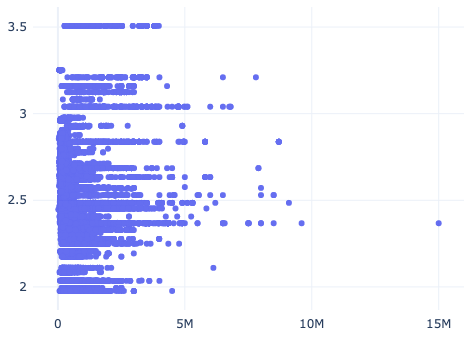
<center> <i> x-axis: Densidad (Hab/Ha)<i> <br>
<i> y-axis: Price <i> <br> No clear (suprasingly) coorelation between price and Density of apartments.<center>

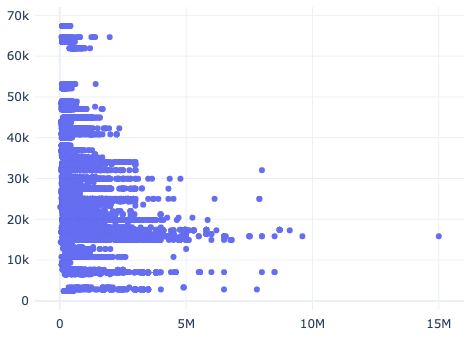
<center> <i> x-axis: Poblacion Total <i> <br>
<i> y-axis: Price <i> <br> Total population of 10-20k exposes the highest price of apartaments <center>

### Missing Values

Before investigating and visualizing further, I decided to first check missing values, because they can heavily impace the distribution and other statistical computations.

inm_floor
Missing Values:  3790 (21.23%)

inm_size
Missing Values:  1766 (9.89%)

inm_barrio
Missing Values:  1794 (10.05%)

inm_distrito
Missing Values:  1747 (9.79%)

dem_PropConEstudiosUniversitarios
Missing Values:  1725 (9.66%)

dem_EdadMedia
Missing Values:  1790 (10.03%)



<AxesSubplot:>

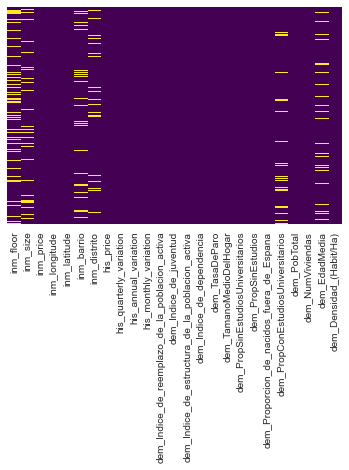

In [204]:
from pandas.api.types import is_numeric_dtype

#Missing values for Each Category
missing_columns_num=[]
missing_columns_non_num=[]
for col in df.columns:
    if df[col].isnull().values.any():
        print(col)
        if is_numeric_dtype(df[col]):
            missing_columns_num.append(col)
        else:
            missing_columns_non_num.append(col)
        missing_count = df[col].isnull().sum()
        print("Missing Values: ", missing_count,  "({:.2%})\n".format(missing_count/ df.shape[0]))

sns.heatmap(df.isnull(), yticklabels=False, cbar=False, cmap="viridis")


In [205]:
#Fill numerical columns with mean 
for col in missing_columns_num:
    mean_value=df[col].mean()
    df[col].fillna(value=mean_value, inplace=True)
    
#Fill numerical columns with mean
for col in missing_columns_non_num:
    df[col].fillna(method="ffill", inplace=True)

<b> Comment <b>

As could be seen, we have several variables with missing values, both categorical and numerical. Because they constitute more than 1-5% of the total dataset, I decided to fill in thos missing values. For categorical variables, I was thinking about filling in with the most frequent value, but because the distribution does say decisively that this dominate value will be the most probable in the real world. Also, I did not want to create an imbalance in a dataset, so I decided to fill with the last valid observation (method=ffill). This will, in my opinion, provide the most reliable way of filling those values given our dataset and distribution of Barrio and Distrito. When it comes to numerical columns, I decided to fill with a mean value, in order to not artificially skew the distribution in one way or another.

### Univariate Analysis

In this part, I am interested in investigation of each variable alone — especially in the context of outliers.

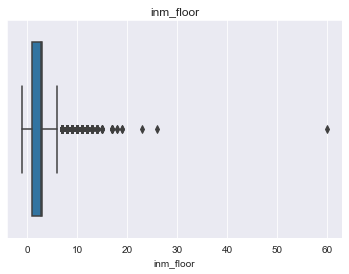

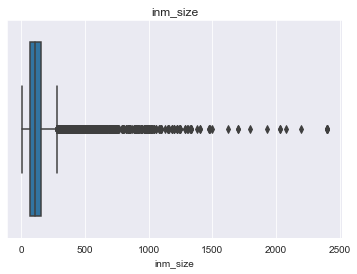

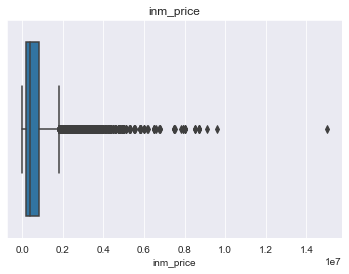

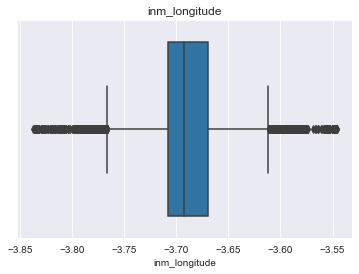

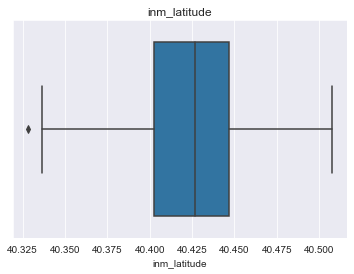

...

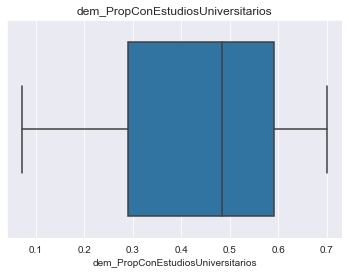

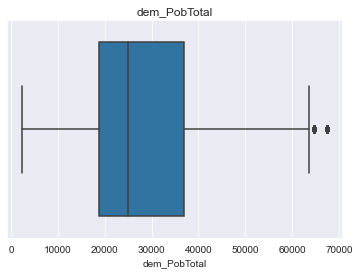

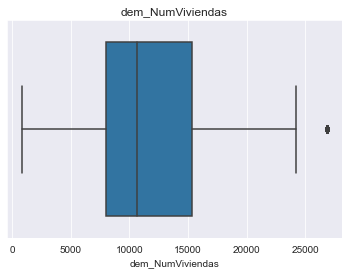

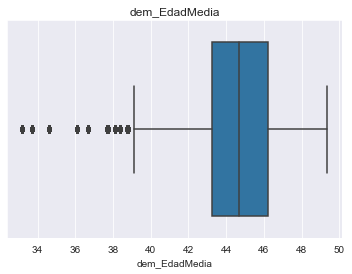

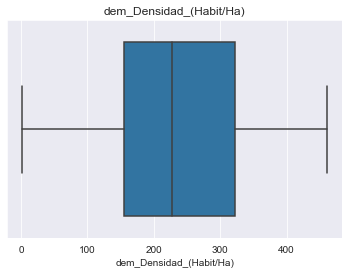

In [206]:
# Univariate Analysis for Numerical Columns
numeric_cols = df.select_dtypes(include=np.number)

# plot boxplot for each numeric column
for col in numeric_cols.columns.tolist():
    sns.boxplot(df[col])
    plt.title(col)
    plt.show()

<b> Comment <b> 
    
Boxplots showed that except — dem_densidad, dem_propconestudiosuniversitations, dem_propsinestudios, dem_propSinEstudioUniversitario, his_price — all columns have outliers which can heavily influence especially Linear Regression models. I wait with tackling outliers untill I make some scailing and transformation to see how they will impact outliers.

In [207]:
df

,inm_floor,inm_size,inm_price,inm_longitude,inm_latitude,inm_barrio,inm_distrito,his_price,his_quarterly_variation,his_annual_variation,...,dem_TasaDeParo,dem_TamanoMedioDelHogar,dem_PropSinEstudiosUniversitarios,dem_PropSinEstudios,dem_Proporcion_de_nacidos_fuera_de_Espana,dem_PropConEstudiosUniversitarios,dem_PobTotal,dem_NumViviendas,dem_EdadMedia,dem_Densidad_(Habit/Ha)
0,3.00000,141.000000,990000,-3.656875,40.464347,Canillas,Hortaleza,3250,2.2,0.3,...,8.724674,2.527886,0.488949,0.175632,15.456193,0.439859,40838,16155,44.315387,161.894356
1,2.00000,159.000000,940000,-3.703523,40.419427,Universidad,Centro,5106,1.4,-4.3,...,9.006094,1.975877,0.386598,0.083812,32.102460,0.529590,33418,16913,43.678945,352.500616
2,2.69675,149.033403,549000,-3.669626,40.435362,Guindalera,Salamanca,4100,0.6,-4.1,...,7.441379,2.369951,0.365818,0.070351,18.224365,0.563831,42306,17851,46.477166,263.952286
3,2.00000,232.000000,750000,-3.720619,40.424164,Argüelles,Moncloa - Aravaca,4773,0.5,-3.7,...,6.709633,2.328217,0.343683,0.066403,20.963846,0.589914,24423,10490,46.972342,322.402577
4,4.00000,183.000000,1550000,-3.705909,40.413214,Sol,Centro,4739,-5.5,-5.3,...,9.058980,1.994244,0.433750,0.082242,39.490947,0.484009,7622,3822,44.632774,171.165183
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17852,0.00000,28.000000,94000,-3.705236,40.448713,Bellas Vistas,Tetuán,3489,-0.3,-0.7,...,9.666273,2.483180,0.507461,0.139521,36.845626,0.353018,29895,12039,43.224268,418.012531
17853,1.00000,247.000000,1250000,-3.797123,40.458962,Aravaca,Tetuán,3683,3.1,0.8,...,5.072028,3.159086,0.318851,0.071317,15.663746,0.609832,27503,8706,40.112479,47.142277
17854,3.00000,73.000000,137260,-3.731940,40.377805,Aravaca,Carabanchel,1859,-0.9,-4.1,...,12.527023,2.858792,0.600245,0.221107,34.012583,0.178648,31947,11175,42.374887,204.190236
17855,5.00000,72.000000,304880,-3.704166,40.455556,Berruguete,Tetuán,3345,1.8,2.8,...,10.119032,2.476095,0.536667,0.153495,37.770383,0.309838,25843,10437,44.315387,425.705154


In [208]:
columns=numeric_cols.columns
df_checkpoint=df.copy()

def remove_outliers(dataset, column):
    q1, q3 = np.percentile(df[column], [25, 75])
    iqr = q3 - q1
    lower_bound = q1 - (1.5 * iqr)
    upper_bound = q3 + (1.5 * iqr)
    dataset = dataset[(dataset[column] >= lower_bound) & (dataset[column] <= upper_bound)]
    return dataset
        

for col in columns:
    df=remove_outliers(df, col)

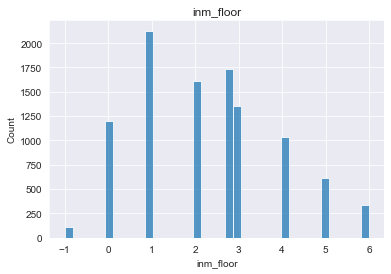

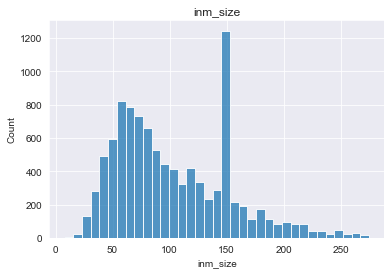

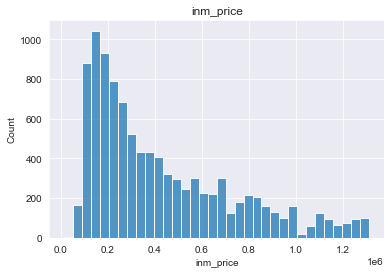

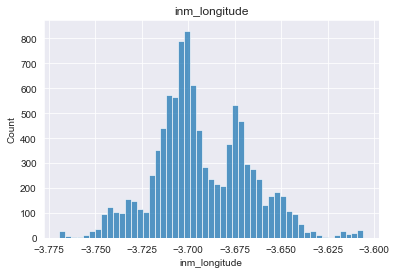

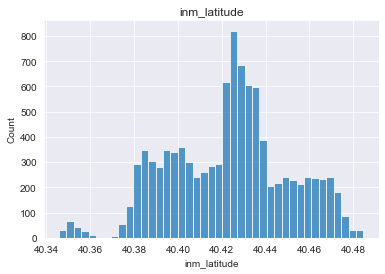

...

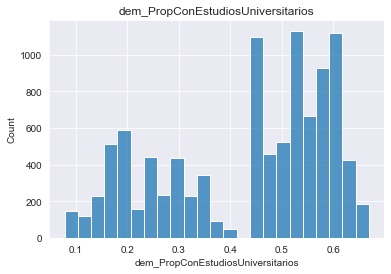

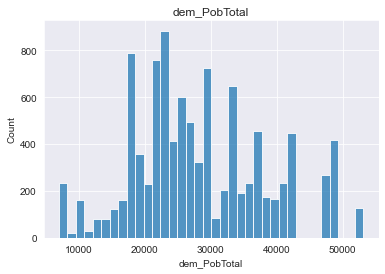

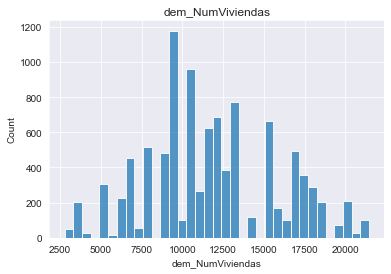

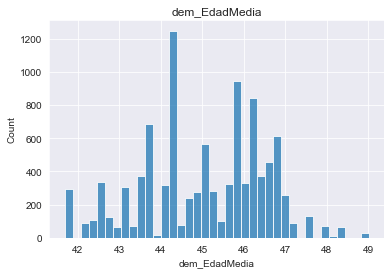

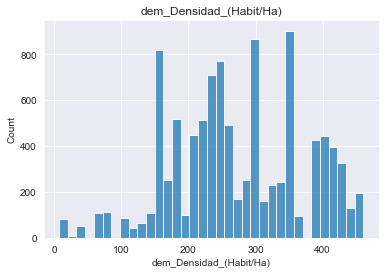

In [209]:
# plot histogram for each numeric column
for col in numeric_cols.columns.tolist():
    sns.histplot(df[col])
    plt.title(col)
    plt.show()

<Figure size 432x288 with 0 Axes>

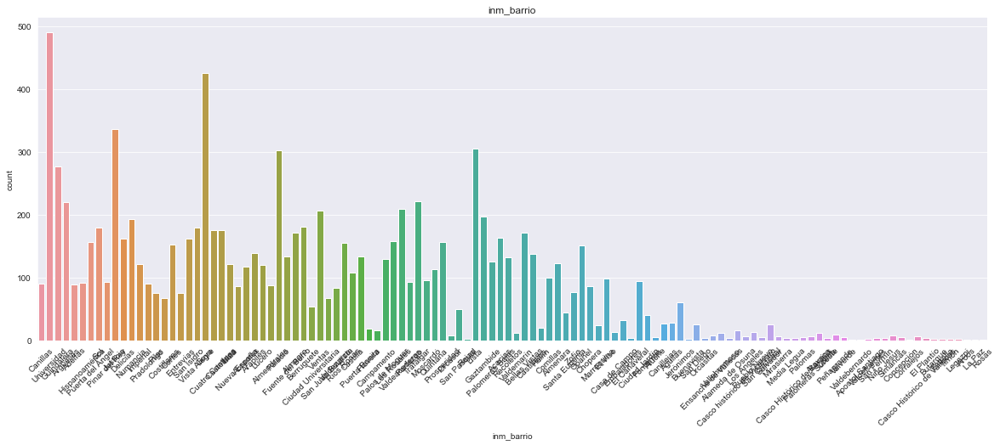

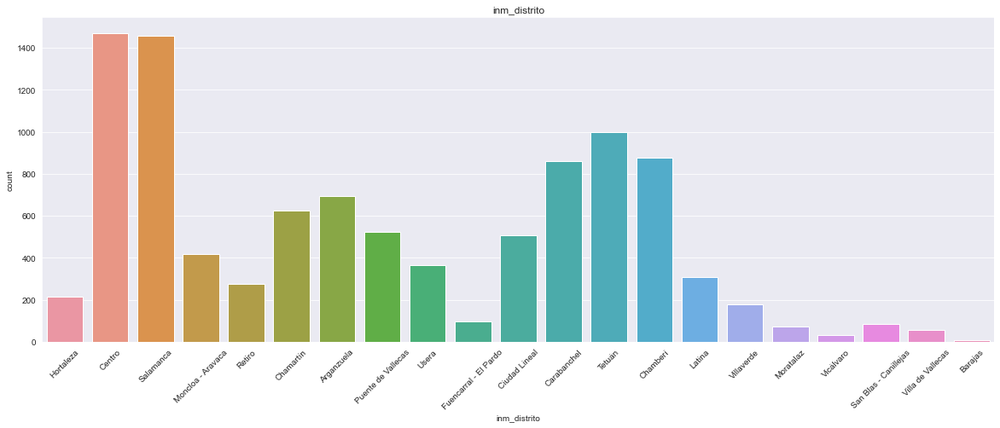

In [210]:
# Univariate Analysis for Non-Numerical Columns
plt.tight_layout()

non_numeric_cols = df.select_dtypes(exclude=np.number)
#plot countplot for each non-numeric column
for col in non_numeric_cols.columns.tolist():
    fig, ax = plt.subplots(figsize=(20, 7))
    sns.countplot(df[col])
    
    plt.title(col)
    plt.xticks(rotation=45)
    plt.show()

<b> Comment <b> 
    
Investigation of categorical variables have shown that we have the most data (Count) for Salamance and Centro (Distrito) and Universidad and Goya (Barrio). Fortunately, this should skew the model that much because differenes are not enormous (in relative terms).

### Bivariate Analysis

In this part I focus on interaction and association between variables. For that I use primarly pairplot. Then I want to investgate association betweeen each of the independent variablea and our dependent variable. NExt I will plot some basic correlation (or mean price for categorical variables) to wrap my head around when it comes to which features will be really important for the overall model.

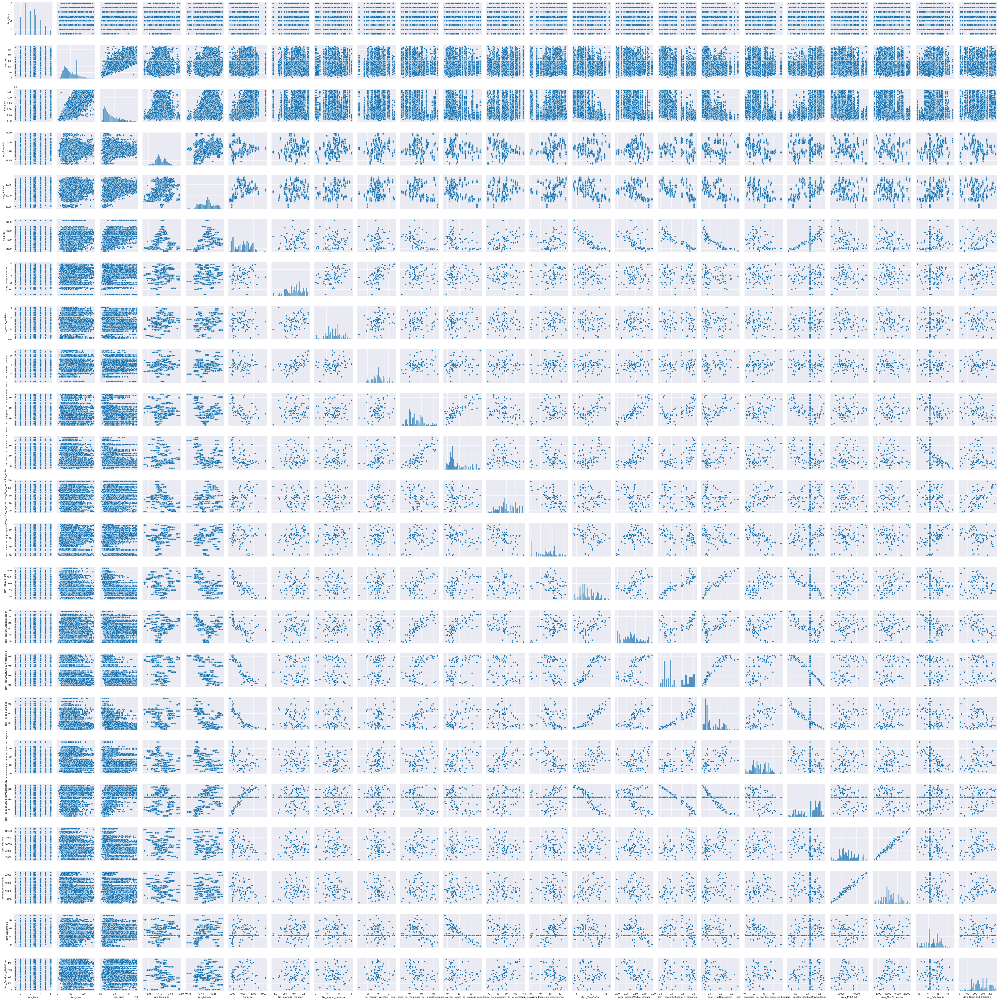

In [40]:
sns.pairplot(df)
plt.show()

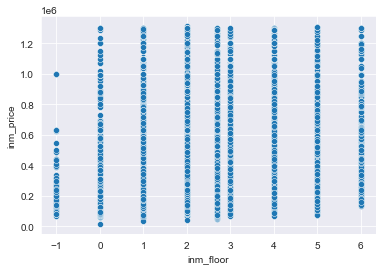

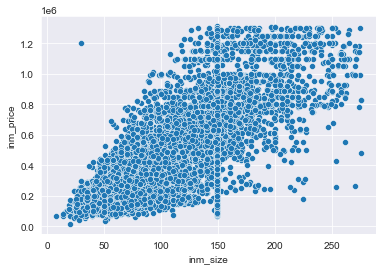

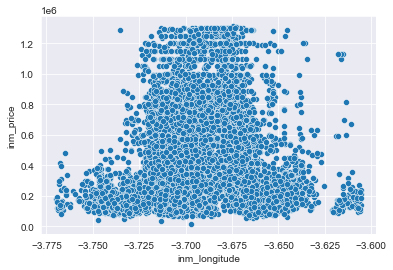

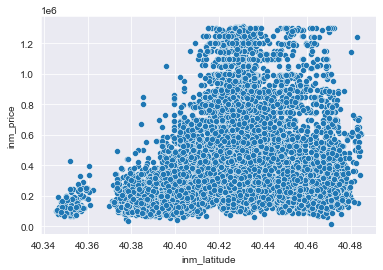

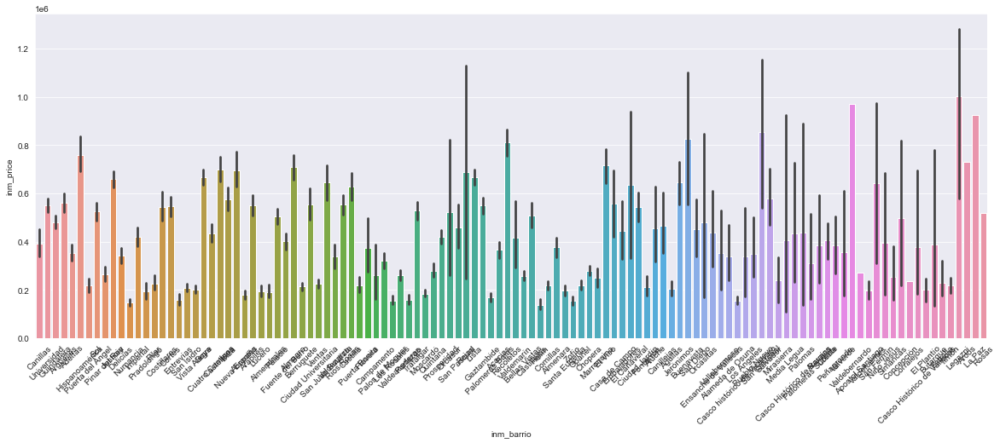

...

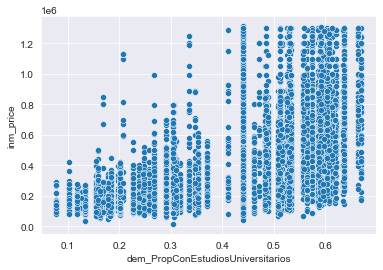

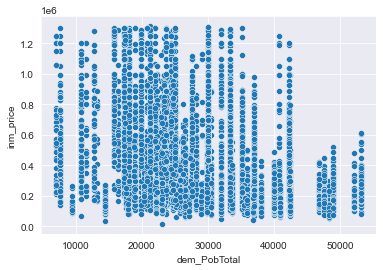

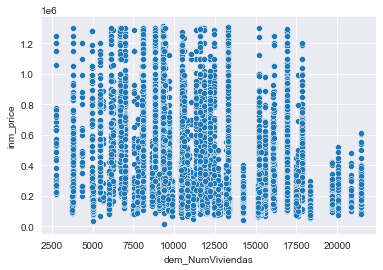

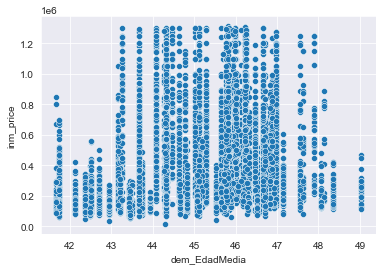

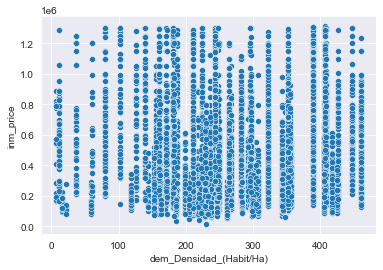

In [211]:
sns.set_style("darkgrid")
def plot_correlation(df, dependent_var):
    """
    Plot correlation between dependent variable and each independent variable
    along with mean price for each category if dependent variable is categorical.
    """
    for col in df.columns:
        if col == dependent_var:
            continue
        if df[col].dtype == 'object':
            # Create a bar plot showing mean price for each category
            fig, ax = plt.subplots(figsize=(20, 7))
            plt.xticks(rotation=45)
            plt.ylabel('mean_price')
            sns.barplot(x=col, y="inm_price", data=df)
            plt.show()
        else:
            # Create a scatter plot showing correlation between independent variable and price
            sns.scatterplot(x=col, y="inm_price", data=df)
            plt.show()

plot_correlation(df, "inm_price")

<b> Comment <b> 

A very interesting characteristics — "Barajas" has quite big variatio when it comes to mean price: way higher than other neighboordhoods of the city.

### Correlation Analysis

In correlation analysis, we look for variables whose correlation coefficient will be higher than 0.8. In those cases we unnecessary use them because they provide a similiar information. On the other hand, we also look for high correlation between dependent variable and independent variables becuase it will allow to check which varaibles will provide the most information for the model.

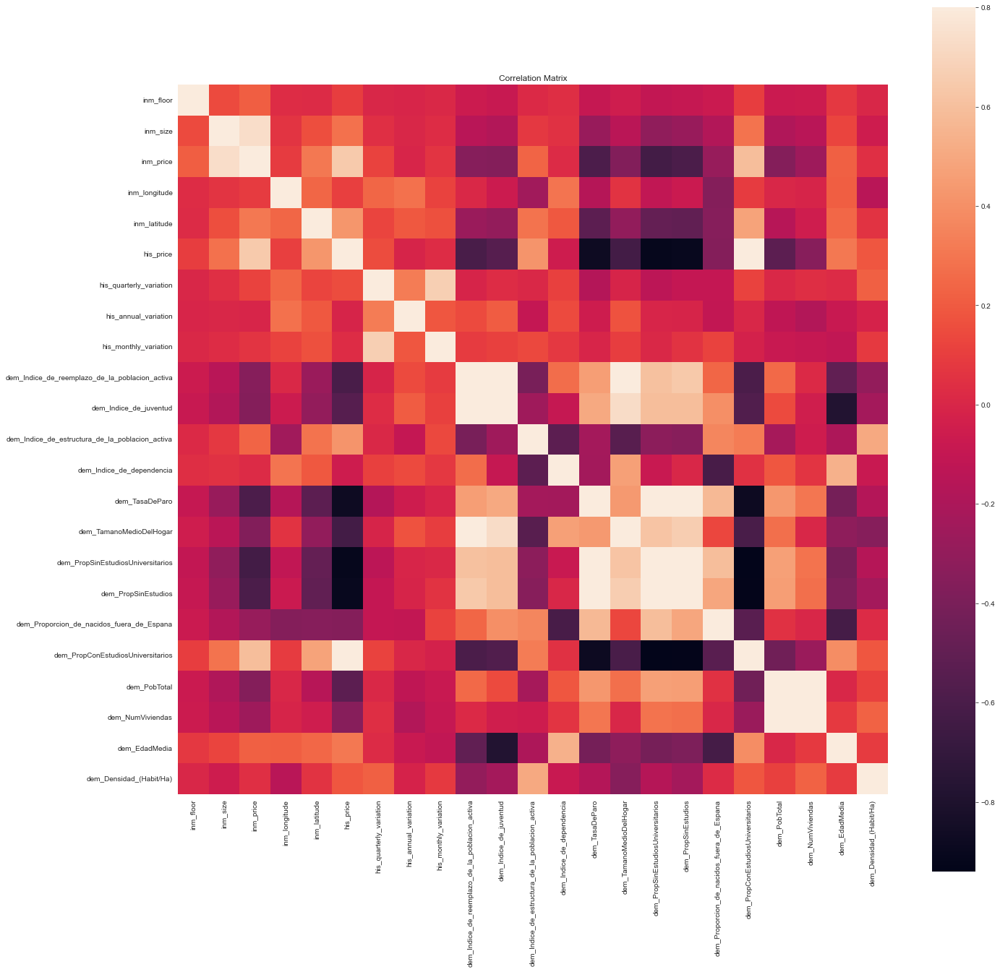

In [212]:
# Correlation Analysis
corr = df.select_dtypes(include=np.number).corr()
f, ax = plt.subplots(figsize=(22, 22))
sns.heatmap(corr, vmax=.8, square=True)
plt.title('Correlation Matrix')
plt.show()

In [213]:
def detect_correlation(data, threshold):
    correlation_set = set()  
    correlation_matrix = data.corr()
    for i in range(len(correlation_matrix.columns)):
        for j in range(i):
            if abs(correlation_matrix.iloc[i, j]) > threshold: 
                correlation_set.add(correlation_matrix.columns[i])
    if len(correlation_set) == 0:
        print("No correlated variables detected")
    else: 
        return correlation_set

detect_correlation(df, 0.8)

{'dem_Indice_de_juventud',
 'dem_NumViviendas',
 'dem_PropConEstudiosUniversitarios',
 'dem_PropSinEstudios',
 'dem_PropSinEstudiosUniversitarios',
 'dem_TamanoMedioDelHogar',
 'dem_TasaDeParo'}

<b> Comment <b> 

Because of high (>0.8) correlation I decided to drop those columns.

In [214]:
df.drop(["dem_NumViviendas", 
         "dem_PropConEstudiosUniversitarios", 
         "dem_PropSinEstudios", 
         "dem_PropSinEstudiosUniversitarios",
         "dem_TamanoMedioDelHogar",
         "dem_TasaDeParo",
         "dem_Indice_de_juventud"
        ], axis=1, inplace=True)

In [215]:
categorical_variables = ["inm_barrio", "inm_distrito"]
for col in categorical_variables:
    print(df[col].value_counts())


Universidad      490
Goya             426
Justicia         337
Lista            305
Palacio          303
                ... 
Corralejos         1
Valdebernardo      1
Arcos              1
La Paz             1
Rosas              1
Name: inm_barrio, Length: 116, dtype: int64
Centro                   1471
Salamanca                1456
Tetuán                    998
Chamberí                  877
Carabanchel               859
Arganzuela                692
Chamartín                 624
Puente de Vallecas        524
Ciudad Lineal             506
Moncloa - Aravaca         417
Usera                     365
Latina                    309
Retiro                    277
Hortaleza                 216
Villaverde                177
Fuencarral - El Pardo      97
San Blas - Canillejas      86
Moratalaz                  71
Villa de Vallecas          57
Vicálvaro                  32
Barajas                     7
Name: inm_distrito, dtype: int64


<b> Comment <b> 

I decided to reduce the cardinality and remove those instances where occurance of given "Barrio" is less than 15.

In [216]:
df_checkpoint1=df.copy()
def remove_small_categories(df, categorical_column):
    # Calculate value counts for the categorical column
    counts = df[categorical_column].value_counts()
    df = df[~df[categorical_column].isin(counts[counts < 15].index)]
    return df

# for cat in categorical_variables:
df=remove_small_categories(df, "inm_barrio")

In [217]:
categorical_variables = ["inm_barrio", "inm_distrito"]
for col in categorical_variables:
    print(df[col].value_counts())


Universidad                     490
Goya                            426
Justicia                        337
Lista                           305
Palacio                         303
                               ... 
Marroquina                       24
Hellín                           20
Piovera                          19
Campamento                       16
Casco histórico de Vicálvaro     16
Name: inm_barrio, Length: 76, dtype: int64
Centro                   1449
Salamanca                1423
Tetuán                    975
Chamberí                  868
Carabanchel               839
Arganzuela                676
Chamartín                 618
Puente de Vallecas        521
Ciudad Lineal             494
Moncloa - Aravaca         397
Usera                     359
Latina                    303
Retiro                    272
Hortaleza                 209
Villaverde                174
Fuencarral - El Pardo      93
San Blas - Canillejas      83
Moratalaz                  68
Villa de Vallecas    

### Scailing & Transformation

Because of different distributions and scales of our independent variables, which does not always approximate a normal distribution, which is required by Linea Regression model, I decided to apply Standard Scaler which works based on standard deviation and transforms the dataset. It removes the mean and scales each feature/variable to unit variance.

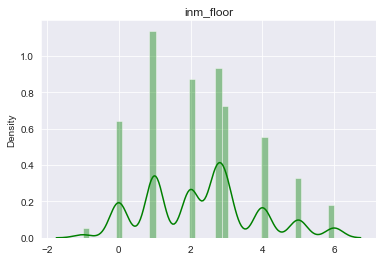

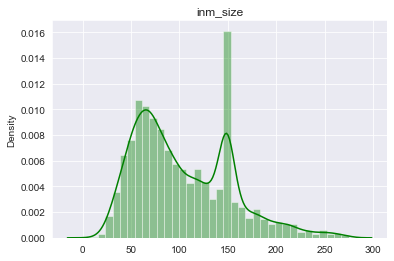

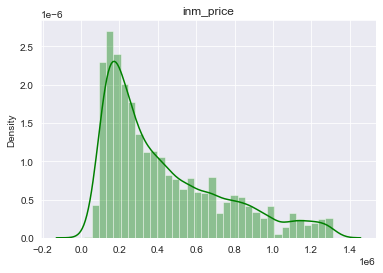

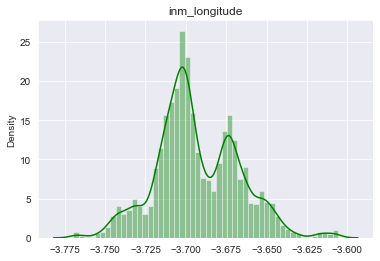

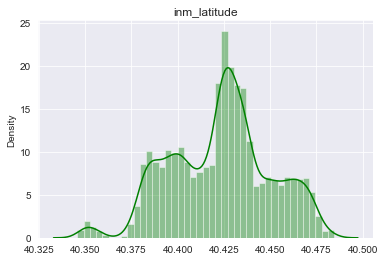

...

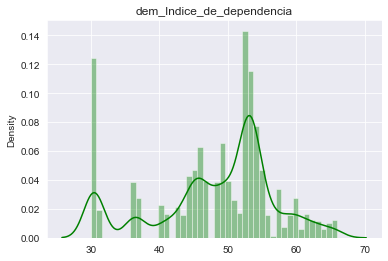

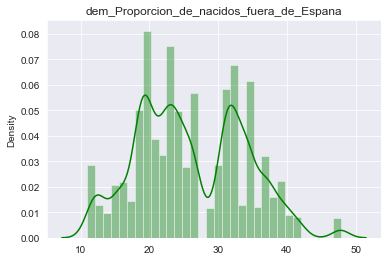

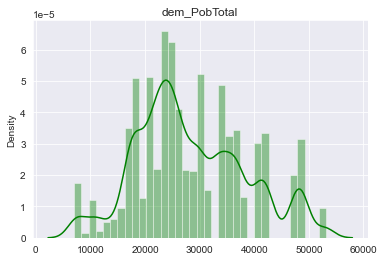

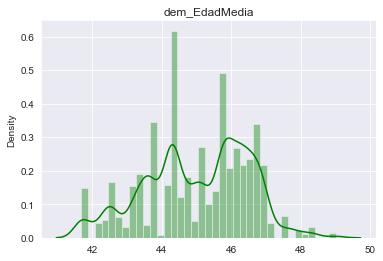

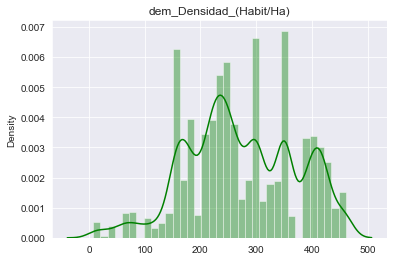

In [219]:
numeric_cols = df.select_dtypes(include=np.number)

# plot histogram for each numeric column
for col in numeric_cols.columns.tolist():
    #sns.histplot(df[col])
    sns.distplot(df[col].values, color='g')
    plt.title(col)
    plt.show()

In [220]:
col_names=numeric_cols.columns

scaler = StandardScaler()

for col in col_names:
    df[col] = scaler.fit_transform(df[col].values.reshape(-1,1))
    
df.head()

,inm_floor,inm_size,inm_price,inm_longitude,inm_latitude,inm_barrio,inm_distrito,his_price,his_quarterly_variation,his_annual_variation,his_monthly_variation,dem_Indice_de_reemplazo_de_la_poblacion_activa,dem_Indice_de_estructura_de_la_poblacion_activa,dem_Indice_de_dependencia,dem_Proporcion_de_nacidos_fuera_de_Espana,dem_PobTotal,dem_EdadMedia,dem_Densidad_(Habit/Ha)
0,0.458545,0.751935,1.835841,1.399435,1.523031,Canillas,Hortaleza,-0.534517,0.986104,0.829982,1.879833,-0.195840,-1.903755,1.628328,-1.362211,1.233897,-0.472593,-1.143597
1,-0.188578,1.113425,1.672118,-0.402840,-0.141066,Universidad,Centro,0.727408,0.597706,-0.694251,0.134325,-1.221461,1.907492,-2.055000,0.772796,0.498719,-0.900979,0.810418
2,0.262305,0.913268,0.391803,0.906798,0.449262,Guindalera,Salamanca,0.043412,0.209308,-0.627980,-0.127502,-0.138530,-0.204084,0.718097,-1.007172,1.379347,0.982490,-0.097342
3,-0.188578,2.579466,1.049970,-1.063352,0.034409,Argüelles,Moncloa - Aravaca,0.500996,0.160758,-0.495438,0.308876,-0.671695,0.047386,0.547483,-0.655814,-0.392511,1.315790,0.501865
6,0.458545,0.109287,0.034886,0.827278,-0.838365,Adelfas,Retiro,0.008736,-0.470389,-0.793658,0.047049,-0.325867,-1.605334,0.670161,-1.804264,-0.951127,0.122172,0.202023


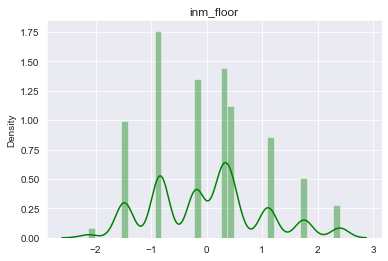

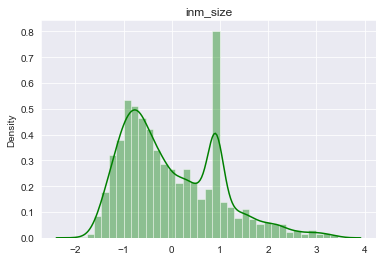

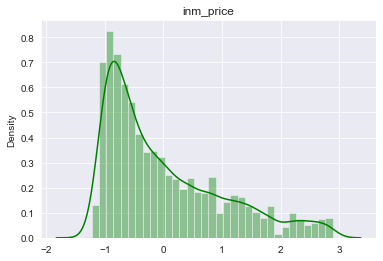

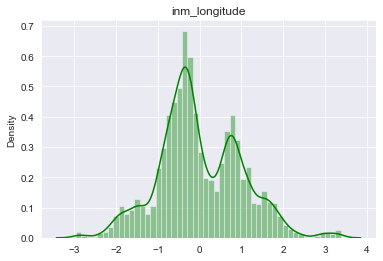

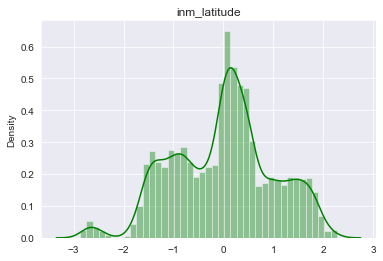

...

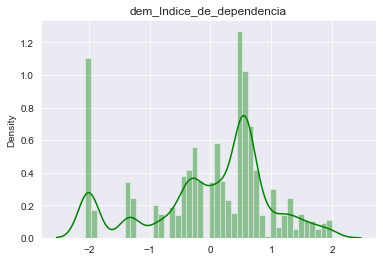

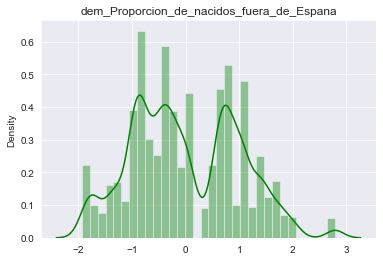

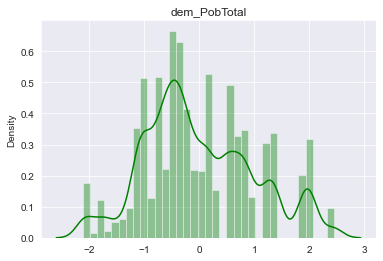

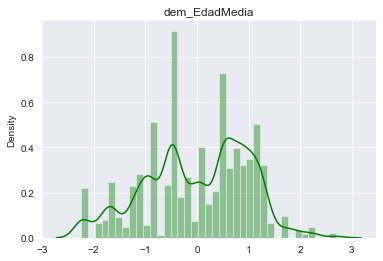

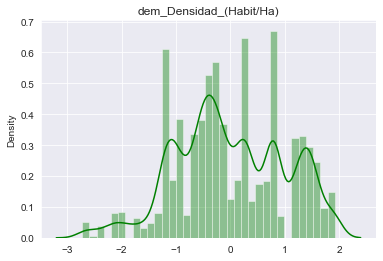

In [156]:
numeric_cols = df.select_dtypes(include=np.number)

# plot histogram AFTER transforamtion
for col in numeric_cols.columns.tolist():
    #sns.histplot(df[col])
    sns.distplot(df[col].values, color='g')
    plt.title(col)
    plt.show()

In [223]:
df_checkpoint1=df.copy()

In [221]:
#Dummy Variables
distrito_dummy= pd.get_dummies(df['inm_distrito'], prefix='distrito_').reset_index(drop=True)

# create dummy variables for the 'size' column
bario_dummy = pd.get_dummies(df['inm_barrio'], prefix='bario_').reset_index(drop=True)

In [222]:
# concatenate the original dataframe with the dummy variables
df1 = pd.concat([df.reset_index(drop=True), bario_dummy, distrito_dummy], axis=1)

df1.drop(["inm_barrio", "inm_distrito"], axis=1, inplace=True)

df1

,inm_floor,inm_size,inm_price,inm_longitude,inm_latitude,his_price,his_quarterly_variation,his_annual_variation,his_monthly_variation,dem_Indice_de_reemplazo_de_la_poblacion_activa,...,distrito__Moratalaz,distrito__Puente de Vallecas,distrito__Retiro,distrito__Salamanca,distrito__San Blas - Canillejas,distrito__Tetuán,distrito__Usera,distrito__Vicálvaro,distrito__Villa de Vallecas,distrito__Villaverde
0,0.458545,0.751935,1.835841,1.399435,1.523031,-0.534517,0.986104,0.829982,1.879833,-0.195840,...,0,0,0,0,0,0,0,0,0,0
1,-0.188578,1.113425,1.672118,-0.402840,-0.141066,0.727408,0.597706,-0.694251,0.134325,-1.221461,...,0,0,0,0,0,0,0,0,0,0
2,0.262305,0.913268,0.391803,0.906798,0.449262,0.043412,0.209308,-0.627980,-0.127502,-0.138530,...,0,0,0,1,0,0,0,0,0,0
3,-0.188578,2.579466,1.049970,-1.063352,0.034409,0.500996,0.160758,-0.495438,0.308876,-0.671695,...,0,0,0,0,0,0,0,0,0,0
4,0.458545,0.109287,0.034886,0.827278,-0.838365,0.008736,-0.470389,-0.793658,0.047049,-0.325867,...,0,0,1,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9908,1.752790,0.832267,1.210419,0.647282,0.201482,1.129239,1.131754,0.299814,0.919804,-0.643213,...,0,0,0,1,0,0,0,0,0,0
9909,-0.835700,0.249867,1.082715,0.482857,-0.072402,1.129239,1.131754,0.299814,0.919804,-0.643213,...,0,0,0,1,0,0,0,0,0,0
9910,-0.835700,-0.051375,0.493311,1.773262,1.304772,-0.534517,0.986104,0.829982,1.879833,-0.195840,...,0,0,0,0,0,0,0,0,0,0
9911,-1.482823,-1.517416,-1.098078,-0.469027,0.943846,-0.372017,-0.227640,0.498627,0.396151,0.292713,...,0,0,0,0,0,1,0,0,0,0


### Splitting Dataset

In [225]:
df=df1.copy()

In [226]:
from sklearn.model_selection import train_test_split
y=df.inm_price 
X=df.drop("inm_price", axis=1)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)

## Modeling

In [230]:
# train a linear regression model
linear_reg = LinearRegression()
linear_reg.fit(X_train, y_train)
y_pred_linear = linear_reg.predict(X_test)
mse_linear = mean_squared_error(y_test, y_pred_linear)
print("Linear Regression MSE: ", mse_linear)

# train a Lasso regression model with cross-validation
lasso_reg = Lasso()
parameters = {'alpha': np.logspace(-4, 4, 9)}
grid_search_lasso = GridSearchCV(lasso_reg, parameters, scoring='neg_mean_squared_error', cv=5)
grid_search_lasso.fit(X_train, y_train)
best_lasso_reg = grid_search_lasso.best_estimator_
y_pred_lasso = best_lasso_reg.predict(X_test)
mse_lasso = mean_squared_error(y_test, y_pred_lasso)
print("\n\nLasso Regression MSE: ", mse_lasso)
print("Lasso Regression Best Coefficient: ", best_lasso_reg)

# train a Ridge regression model with cross-validation
ridge_reg = Ridge()
parameters = {'alpha': np.logspace(-4, 4, 9)}
grid_search_ridge = GridSearchCV(ridge_reg, parameters, scoring='neg_mean_squared_error', cv=5)
grid_search_ridge.fit(X_train, y_train)
best_ridge_reg = grid_search_ridge.best_estimator_
y_pred_ridge = best_ridge_reg.predict(X_test)
mse_ridge = mean_squared_error(y_test, y_pred_ridge)
print("\n\nRidge Regression MSE: ", mse_ridge)
print("Ridge Regression Best Coefficient: ", best_ridge_reg)

# Decision Tree
from sklearn.tree import DecisionTreeRegressor

# Creating the Decision Tree model
dt_reg = DecisionTreeRegressor()

# Defining the parameters to be tuned
parameters = {'max_depth': [2, 4, 6, 8], 'min_samples_leaf': [1, 2, 4, 8], 'min_samples_split': [2, 4, 8, 16]}

# Performing GridSearchCV
grid_search_dt = GridSearchCV(dt_reg, parameters, scoring='neg_mean_squared_error', cv=5)
grid_search_dt.fit(X_train, y_train)
best_dt_reg = grid_search_dt.best_estimator_

# Making the predictions on the test set
y_pred_dt = best_dt_reg.predict(X_test)

# Calculating the mean squared error
mse_dt = mean_squared_error(y_test, y_pred_dt)

# Printing the results
print("\n\nDecision Tree Regression MSE: ", mse_dt)
print("Decision Tree Regression Best Coefficient: ", best_dt_reg)

import xgboost as xgb

# Creating the XGBoost model
xgb_reg = xgb.XGBRegressor()

# Defining the parameters to be tuned
parameters = {'learning_rate': [0.01, 0.1, 0.2, 0.3], 'max_depth': [2, 4, 6, 8], 'n_estimators': [100, 200, 300, 400]}

# Performing GridSearchCV
grid_search_xgb = GridSearchCV(xgb_reg, parameters, scoring='neg_mean_squared_error', cv=5)
grid_search_xgb.fit(X_train, y_train)
best_xgb_reg = grid_search_xgb.best_estimator_

# Making the predictions on the test set
y_pred_xgb = best_xgb_reg.predict(X_test)

# Calculating the mean squared error
mse_xgb = mean_squared_error(y_test, y_pred_xgb)

# Printing the results
print("\n\nXGBoost Regression MSE: ", mse_xgb)
print("XGBoost Regression Best Coefficient: ", best_xgb_reg)


Linear Regression MSE:  0.24155706810315067


Lasso Regression MSE:  0.24032651947533892
Ridge Lasso Best Coefficient:  Lasso(alpha=0.0001)


Ridge Regression MSE:  0.23997332256114737
Ridge Regression Best Coefficient:  Ridge(alpha=10.0)


Decision Tree Regression MSE:  0.19428103180053047
Decision Tree Regression Best Coefficient:  DecisionTreeRegressor(max_depth=8, min_samples_split=8)


XGBoost Regression MSE:  0.15528672614791553
XGBoost Regression Best Coefficient:  XGBRegressor(base_score=0.5, booster='gbtree', callbacks=None,
             colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
             early_stopping_rounds=None, enable_categorical=False,
             eval_metric=None, feature_types=None, gamma=0, gpu_id=-1,
             grow_policy='depthwise', importance_type=None,
             interaction_constraints='', learning_rate=0.1, max_bin=256,
             max_cat_threshold=64, max_cat_to_onehot=4, max_delta_step=0,
             max_depth=8, max_leaves=0, m

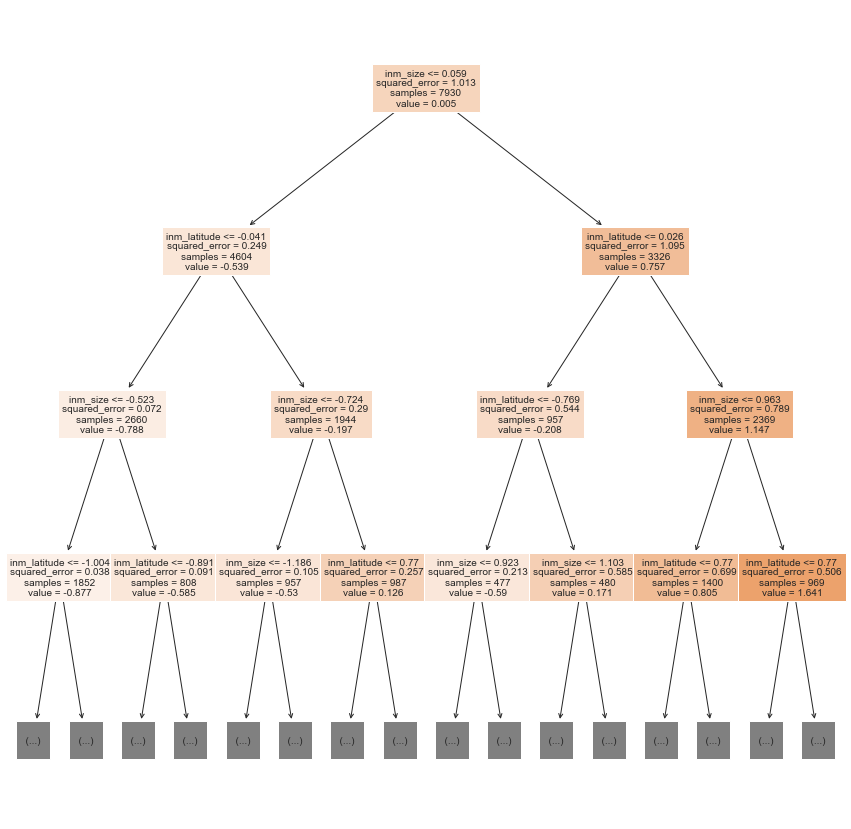

In [247]:
from sklearn import tree
fig = plt.figure(figsize=(15,15))
_ = tree.plot_tree(best_dt_reg, feature_names=df.columns, filled=True, max_depth=3, fontsize=10)
plt.show()

<b> Comment <b>

Based on trained models we can conclude that the performance is quite similiar when it comes to Linear Regression, Lasso Regression, and Ridge Regression. This, however, may vary in different dataset — here we conlclude that improvements using Ridge and Lasso do not bring that much results (based on dataset that we have here). It's also insigtful that Lasso works best with alpha 0.0001 and Ridge with alphfa of 10.
    
The real/significant improvement starts when we applied Decision Tree with max depth of 8 and min_samples_split=8 and XGBoost with set of best parameteres. We conclude that <b> Decision Tree and XGBoost <b> performed the best.

# Classification Problem — Let's Predict Barrio!

In [232]:
df2=df_checkpoint1.copy()

In [233]:
#Dummy Variables
distrito_dummy_class = pd.get_dummies(df2['inm_distrito'], prefix='distrito_').reset_index(drop=True)

# concatenate the original dataframe with the dummy variables
df3 = pd.concat([df2.reset_index(drop=True), distrito_dummy_class], axis=1)

df3.drop(["inm_distrito"], axis=1, inplace=True)

In [234]:
le = LabelEncoder()
target_encoded = le.fit_transform(df3.inm_barrio)

In [235]:
X_train, X_test, y_train, y_test = train_test_split(df3.drop(["inm_barrio"], axis=1), target_encoded, test_size=0.2)

Cross-Validation Results

Perceptron accuracy (cross-validation): 0.826996218615039
Logistic Regression accuracy (cross-validation): 0.9152631881588864

Test Results

Perceptron accuracy (test set): 0.8693898134140191
Logistic Regression accuracy (test set): 0.9157841654059505

F1 Scores

Perceptron F1 score (test set): 0.8594728749800582
Logistic Regression F1 score (test set): 0.9120210788672336


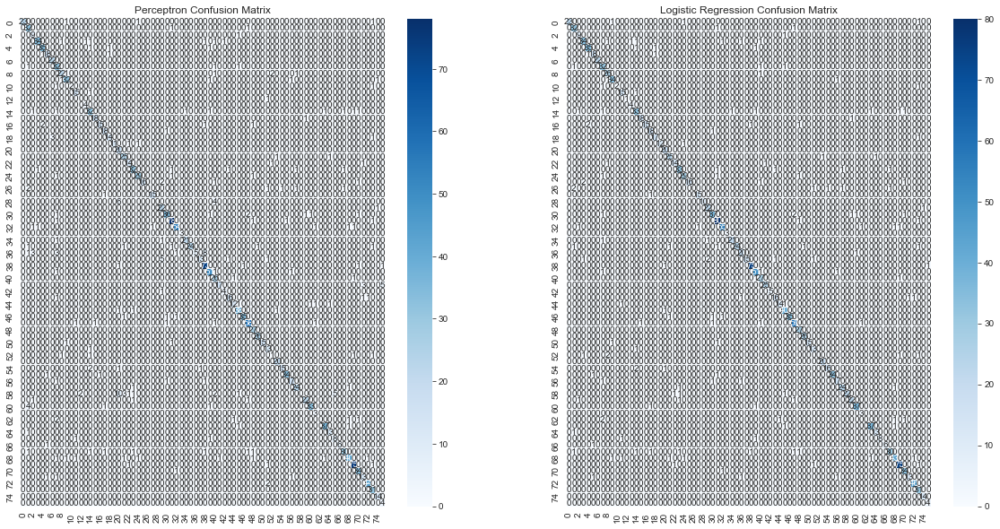

In [238]:
from sklearn.metrics import accuracy_score, f1_score, confusion_matrix

# create Perceptron model
perceptron = Perceptron(random_state=42)
perceptron_scores = cross_val_score(perceptron, df3.drop(["inm_barrio"], axis=1), target_encoded, cv=5)
print("Cross-Validation Results\n")
print("Perceptron accuracy (cross-validation):", perceptron_scores.mean())

# create Logistic Regression model
logreg = LogisticRegression(random_state=42, multi_class='ovr')
logreg_scores = cross_val_score(logreg, df3.drop(["inm_barrio"], axis=1), target_encoded, cv=5)
print("Logistic Regression accuracy (cross-validation):", logreg_scores.mean())

# fit the models on the training data
perceptron.fit(X_train, y_train)
logreg.fit(X_train, y_train)

# predict the labels for the test data
y_pred_perceptron = perceptron.predict(X_test)
y_pred_logreg = logreg.predict(X_test)

# calculate and print the accuracies of the models
acc_perceptron = accuracy_score(y_test, y_pred_perceptron)
acc_logreg = accuracy_score(y_test, y_pred_logreg)

# calculate and print the f1 scores of the models
f1_perceptron = f1_score(y_test, y_pred_perceptron, average='weighted')
f1_logreg = f1_score(y_test, y_pred_logreg, average='weighted')

# calculate and print the confusion matrix of the models
cm_perceptron = confusion_matrix(y_test, y_pred_perceptron)
cm_logreg = confusion_matrix(y_test, y_pred_logreg)

# calculate and print the confusion matrix of the models
cm_perceptron = confusion_matrix(y_test, y_pred_perceptron)
cm_logreg = confusion_matrix(y_test, y_pred_logreg)
print("\nTest Results\n")
print("Perceptron accuracy (test set):", acc_perceptron)
print("Logistic Regression accuracy (test set):", acc_logreg)

print("\nF1 Scores\n")
print("Perceptron F1 score (test set):", f1_perceptron)
print("Logistic Regression F1 score (test set):", f1_logreg)

# visualize the confusion matrix
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(20, 10))
sns.heatmap(cm_perceptron, annot=True, cmap='Blues', fmt='g', ax=axes[0])
sns.heatmap(cm_logreg, annot=True, cmap='Blues', fmt='g', ax=axes[1])
axes[0].set_title('Perceptron Confusion Matrix')
axes[1].set_title('Logistic Regression Confusion Matrix')
plt.show()

Best Hyperparameters for LDA:  {'solver': 'svd'}
LDA Classification Report: 
              precision    recall  f1-score   support

           0       1.00      0.85      0.92        26
           1       0.84      0.91      0.87        34
           2       0.64      0.70      0.67        10
           3       0.94      0.85      0.89        40
           4       0.92      0.92      0.92        38
           5       0.85      0.85      0.85        20
           6       1.00      0.95      0.98        22
           7       0.67      0.89      0.77        35
           8       0.84      0.96      0.90        27
           9       0.92      0.94      0.93        36
          10       1.00      0.50      0.67         4
          11       0.79      0.94      0.86        16
          12       0.00      0.00      0.00         1
          13       0.67      1.00      0.80         4
          14       0.82      0.82      0.82        40
          15       0.95      0.95      0.95        19
    

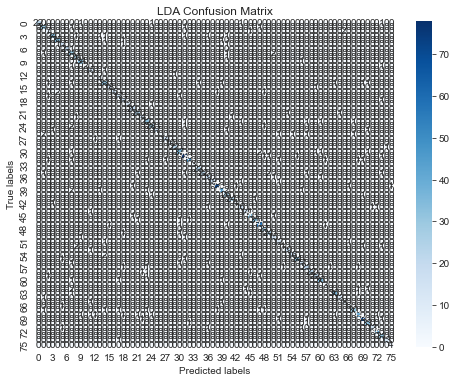

Best Hyperparameters for QDA:  {'reg_param': 1.0}
QDA Classification Report: 
              precision    recall  f1-score   support

           0       1.00      0.88      0.94        26
           1       0.84      0.94      0.89        34
           2       0.75      0.90      0.82        10
           3       0.95      0.88      0.91        40
           4       0.92      0.92      0.92        38
           5       0.86      0.90      0.88        20
           6       1.00      1.00      1.00        22
           7       0.80      0.91      0.85        35
           8       0.84      0.96      0.90        27
           9       0.92      0.94      0.93        36
          10       1.00      0.50      0.67         4
          11       0.88      0.94      0.91        16
          12       1.00      1.00      1.00         1
          13       0.80      1.00      0.89         4
          14       0.82      0.82      0.82        40
          15       0.95      0.95      0.95        19
   

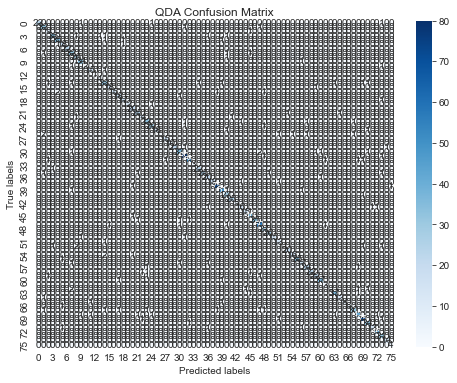

In [239]:
# Create an LDA model
lda = LinearDiscriminantAnalysis()

# Perform cross-validation to tune the hyperparameters
params = {'solver': ['svd', 'lsqr', 'eigen']}
lda_cv = GridSearchCV(lda, params, cv=5)
lda_cv.fit(X_train, y_train)

# Print the best hyperparameters
print("Best Hyperparameters for LDA: ", lda_cv.best_params_)

# Fit the model using the best hyperparameters
lda = LinearDiscriminantAnalysis(**lda_cv.best_params_)
lda.fit(X_train, y_train)

# Evaluate the model using the testing set
lda_predictions = lda.predict(X_test)
print("LDA Classification Report: ")
print(classification_report(y_test, lda_predictions))

# Plot the confusion matrix
lda_cm = confusion_matrix(y_test, lda_predictions)
plt.figure(figsize=(8,6))
sns.heatmap(lda_cm, annot=True, cmap='Blues', fmt='g')
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('LDA Confusion Matrix')
plt.show()

# Create a QDA model
qda = QuadraticDiscriminantAnalysis()

# Perform cross-validation to tune the hyperparameters
params = {'reg_param': [0.0, 0.1, 0.5, 1.0]}
qda_cv = GridSearchCV(qda, params, cv=5)
qda_cv.fit(X_train, y_train)

# Print the best hyperparameters
print("Best Hyperparameters for QDA: ", qda_cv.best_params_)

# Fit the model using the best hyperparameters
qda = QuadraticDiscriminantAnalysis(**qda_cv.best_params_)
qda.fit(X_train, y_train)

# Evaluate the model using the testing set
qda_predictions = qda.predict(X_test)
print("QDA Classification Report: ")
print(classification_report(y_test, qda_predictions))

# Plot the confusion matrix
qda_cm = confusion_matrix(y_test, qda_predictions)
plt.figure(figsize=(8,6))
sns.heatmap(qda_cm, annot=True, cmap='Blues', fmt='g')
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('QDA Confusion Matrix')
plt.show()

In [243]:
# KNN
knn = KNeighborsClassifier()
knn_param_grid = {'n_neighbors': [3, 5, 7]}
knn_grid = GridSearchCV(knn, knn_param_grid, cv=5)
knn_grid.fit(X_train, y_train)
knn_best = knn_grid.best_estimator_

knn_pred = knn_best.predict(X_test)
knn_accuracy = accuracy_score(y_test, knn_pred)
knn_precision = precision_score(y_test, knn_pred, average='weighted')
knn_recall = recall_score(y_test, knn_pred, average='weighted')
knn_f1 = f1_score(y_test, knn_pred, average='weighted')
knn_cm = confusion_matrix(y_test, knn_pred)
print("\nKNN Results:")
print("Accuracy: {:.3f}".format(knn_accuracy))
print("Precision: {:.3f}".format(knn_precision))
print("Recall: {:.3f}".format(knn_recall))
print("F1 Score: {:.3f}".format(knn_f1))

# Random Forest
rf = RandomForestClassifier()
rf_param_grid = {'n_estimators': [100, 200, 300], 'max_depth': [3, 5, 7]}
rf_grid = GridSearchCV(rf, rf_param_grid, cv=5)
rf_grid.fit(X_train, y_train)
rf_best = rf_grid.best_estimator_
rf_pred = rf_best.predict(X_test)
rf_accuracy = accuracy_score(y_test, rf_pred)
rf_precision = precision_score(y_test, rf_pred, average='weighted')
rf_recall = recall_score(y_test, rf_pred, average='weighted')
rf_f1 = f1_score(y_test, rf_pred, average='weighted')
rf_cm = confusion_matrix(y_test, rf_pred)
print("\nRandom Forest Results:")
print("Accuracy: {:.3f}".format(rf_accuracy))
print("Precision: {:.3f}".format(rf_precision))
print("Recall: {:.3f}".format(rf_recall))
print("F1 Score: {:.3f}".format(rf_f1))



KNN Results:
Accuracy: 0.921
Precision: 0.917
Recall: 0.921
F1 Score: 0.917

Random Forest Results:
Accuracy: 0.905
Precision: 0.892
Recall: 0.905
F1 Score: 0.896


<b> Comment <b>
    
We can clearly see that Logistic Regression outperforms Perceptron algorithm on cross-validation, test-set, and when it comes to F1 Score. Moreover, it also outcompetes Generative Models, Random Forest, and it's roughly the same level as KNN. This is really interesting because Logisti Regression is thought to be a very basic model but as the practice shows, it performs really well. Possible scenarios why Logistic Regression performs so good:
   1. Simplicity: Logistic Regression is a simple and easy-to-understand algorithm. It has a linear decision boundary and can be trained using gradient descent or other optimization techniques.

2. Interpretable: The coefficients of logistic regression are easily interpretable and can provide insights into the importance of each feature in the classification decision.

3. Handling linearly separable data: Logistic Regression is particularly effective when dealing with linearly separable data. In such cases, it can achieve high accuracy with a small number of features.

4. Robustness to noise: Logistic Regression can be more robust to noise and outliers compared to other algorithms like KNN, which are sensitive to the distance metric used.

5. Imbalanced data: Logistic Regression can handle imbalanced data well, by adjusting the threshold for classification.